In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
!pip install spotipy
import spotipy

import plotly.express as px
import plotly.graph_objects as go
!pip install chart_studio
import chart_studio
import chart_studio.plotly as py

import os
from google.colab import drive

drive.mount('/content/drive')
import chart_studio.tools as tls

# Prompt for credentials (be mindful of security when handling this input)
username = str('Omdiwan')
api_key = input("Enter your Plotly API key: ")

# Temporarily store in environment variables for this session
os.environ['PLOTLY_USERNAME'] = username
os.environ['PLOTLY_API_KEY'] = api_key

# Now use the environment variables to set credentials
tls.set_credentials_file(username=os.environ['PLOTLY_USERNAME'], api_key=os.environ['PLOTLY_API_KEY'])
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict
# Prompt for credentials (be mindful of security when handling this input)
client_id = str('2498f07dcbde476781639c2d3e2f442c')
client_secret = input("Enter your spotify API key: ")

# Temporarily store in environment variables for this session
os.environ['PLOTLY_USERNAME'] = client_id
os.environ['PLOTLY_API_KEY'] = client_secret

# Now use the environment variables to set credentials
sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id,client_secret))

print("Plotly and spotify credentials set successfully!")
chart_studio.tools.set_credentials_file(username=username, api_key=api_key)
plt.rcParams.update({'font.size': 22})
%matplotlib inline

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Enter your Plotly API key: DkiBL7aHhMsB9ou9XJZj
Enter your spotify API key: 1638db03fba44367b1fa813b136b8bc5
Plotly and spotify credentials set successfully!


In [ ]:
spotify_data = pd.read_csv('drive/My Drive/data.csv')
genre_data = pd.read_csv('drive/My Drive/data_by_genres.csv')
data_by_year = pd.read_csv('drive/My Drive/data_by_year.csv')
spotify_data.head(10)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665
5,0.1960,1921,0.579,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.697,395076,0.346,0,4pyw9DVHGStUre4J6hPngr,0.168000,2,0.130,-12.506,1,Gati Mardika,6,1921,0.0700,119.824
6,0.4060,1921,0.996,['John McCormack'],0.518,159507,0.203,0,5uNZnElqOS3W4fRmRYPk4T,0.000000,0,0.115,-10.589,1,The Wearing of the Green,4,1921,0.0615,66.221
7,0.0731,1921,0.993,['Sergei Rachmaninoff'],0.389,218773,0.088,0,02GDntOXexBFUvSgaXLPkd,0.527000,1,0.363,-21.091,0,"Morceaux de fantaisie, Op. 3: No. 2, Prélude i...",2,1921,0.0456,92.867
8,0.7210,1921,0.996,['Ignacio Corsini'],0.485,161520,0.130,0,05xDjWH9ub67nJJk82yfGf,0.151000,5,0.104,-21.508,0,La Mañanita - Remasterizado,0,1921-03-20,0.0483,64.678
9,0.7710,1921,0.982,['Fortugé'],0.684,196560,0.257,0,08zfJvRLp7pjAb94MA9JmF,0.000000,8,0.504,-16.415,1,Il Etait Syndiqué,0,1921,0.3990,109.378


In [ ]:
spotify_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [ ]:
genre_data.head(10)

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7
5,1,abstract,0.459210,0.516167,3.431965e+05,0.442417,0.849667,0.118067,-15.472083,0.046517,127.885750,0.307325,43.500000,1
6,1,abstract beats,0.342147,0.623000,2.299362e+05,0.527800,0.333603,0.099653,-7.918000,0.116373,112.413800,0.493507,58.933333,10
7,1,abstract hip hop,0.243854,0.694571,2.318492e+05,0.646235,0.024231,0.168543,-7.349328,0.214258,108.244987,0.571391,39.790702,2
8,0,accordeon,0.323000,0.588000,1.640000e+05,0.392000,0.441000,0.079400,-14.899000,0.072700,109.131000,0.709000,39.000000,2
9,1,accordion,0.446125,0.624812,1.670616e+05,0.373437,0.193738,0.160300,-14.487063,0.078537,112.872438,0.658688,21.937500,2


In [ ]:
genre_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB


In [ ]:
data_by_year.head(10)

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,1921,0.886896,0.418597,260537.166667,0.231815,0.344878,0.205710,-17.048667,0.073662,101.531493,0.379327,0.653333,2
1,1,1922,0.938592,0.482042,165469.746479,0.237815,0.434195,0.240720,-19.275282,0.116655,100.884521,0.535549,0.140845,10
2,1,1923,0.957247,0.577341,177942.362162,0.262406,0.371733,0.227462,-14.129211,0.093949,114.010730,0.625492,5.389189,0
3,1,1924,0.940200,0.549894,191046.707627,0.344347,0.581701,0.235219,-14.231343,0.092089,120.689572,0.663725,0.661017,10
4,1,1925,0.962607,0.573863,184986.924460,0.278594,0.418297,0.237668,-14.146414,0.111918,115.521921,0.621929,2.604317,5
5,1,1926,0.660817,0.599880,156881.657475,0.211467,0.333093,0.232370,-18.492538,0.483704,109.648033,0.436910,1.422351,9
6,1,1927,0.936179,0.648268,184993.598374,0.264321,0.391328,0.168450,-14.422374,0.113610,114.846524,0.659700,0.801626,7
7,1,1928,0.938617,0.534288,214827.906423,0.207948,0.494835,0.175289,-17.191983,0.159911,106.772262,0.495713,1.525773,1
8,1,1929,0.601427,0.647670,168999.412815,0.241801,0.215204,0.236000,-16.530376,0.490001,110.948357,0.636530,0.340336,7
9,1,1930,0.936715,0.518176,195150.285343,0.333524,0.352206,0.221311,-12.869221,0.119910,109.871194,0.616238,0.926715,2


In [ ]:
data_by_year.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB


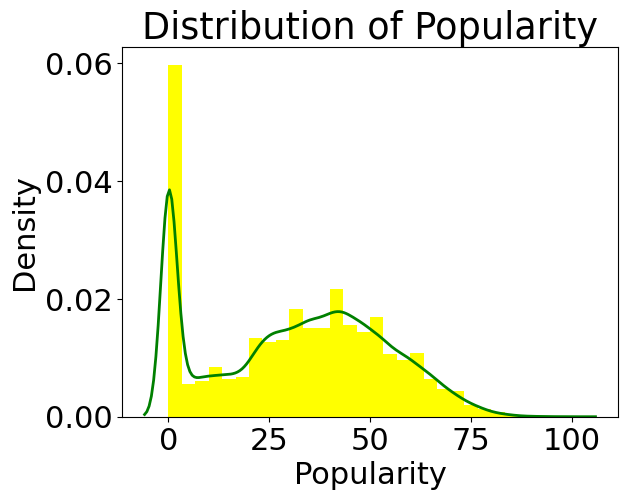

In [ ]:
hist, bins = np.histogram(spotify_data['popularity'], bins=30, density=True)

# Plot histogram
plt.bar(bins[:-1], hist, width=(bins[1]-bins[0]), align='edge', color='yellow')

# Plot KDE
sns.kdeplot(spotify_data['popularity'], color='green', linewidth=2)

plt.title('Distribution of Popularity')
plt.xlabel('Popularity')
plt.ylabel('Density')
plt.show()

In [ ]:
def get_decade(year):

    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)

    return decade

spotify_data['decade'] = spotify_data['year'].apply(get_decade)

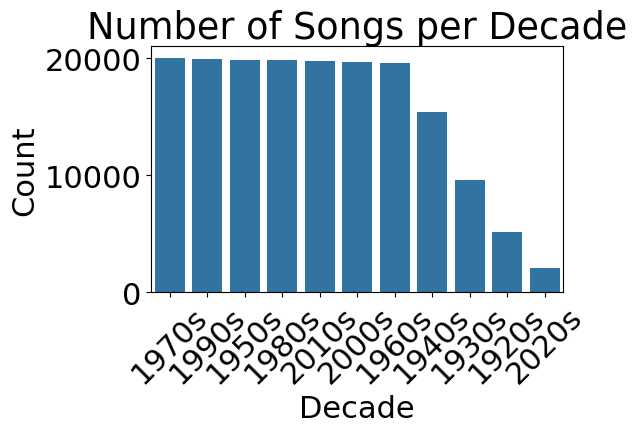

In [ ]:
decade_counts = spotify_data['decade'].value_counts()

# Create the bar plot
sns.barplot(x=decade_counts.index, y=decade_counts.values)

plt.title('Number of Songs per Decade')
plt.xlabel('Decade')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent labels from overlapping
plt.show()

In [ ]:

sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(data_by_year,x='year',y=sound_features)
fig.show()





*   We can see that acousticness has decreased drastically since the 1950s.
*   Along with that, instumentalness also has gradually decreased over the decades.
*   Energy has rapidly increased over the decades.
*   Danceability has been gradually increasing since 1960s.
*  Liveness has been consistent since 1920s which is incredible.
*   









In [ ]:
fig = px.line(data_by_year, x='year', y='tempo')

fig.show()


Tempo has increased drastically during 1950s and has stayed high for 5 decades.

In [ ]:
top10_genres = genre_data.nlargest(10, 'popularity')
top10_genres.describe()

,mode,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,0.500000,0.098524,0.775275,202354.787500,0.755769,0.106066,0.189985,-5.494652,0.093613,116.912296,0.616062,78.597917,5.200000
std,0.527046,0.134523,0.077869,45462.621062,0.148722,0.193488,0.110336,1.520863,0.052185,17.258035,0.217039,1.472289,4.685676
min,0.000000,0.002570,0.660000,144000.000000,0.562333,0.000000,0.075133,-7.719000,0.032000,83.250125,0.199000,77.000000,0.000000
25%,0.000000,0.008475,0.720063,181671.531250,0.643875,0.000001,0.082375,-6.578125,0.053725,105.288125,0.556000,77.078125,1.000000
50%,0.500000,0.026432,0.755500,189818.000000,0.748000,0.000027,0.168975,-5.652000,0.077400,121.869167,0.632646,78.500000,4.500000
75%,1.000000,0.171025,0.839750,213472.750000,0.851500,0.097819,0.297000,-4.332500,0.130375,127.770250,0.733750,80.000000,10.000000
max,1.000000,0.330000,0.885000,311854.333333,0.972000,0.465000,0.326000,-3.506000,0.195563,142.018000,0.937000,80.666667,11.000000


In [ ]:
custom_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group',color_discrete_sequence = custom_colors)

fig.show()

In [ ]:

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])

X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [ ]:
from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=2))])
genre_embedding = tsne_pipeline.fit_transform(X)

projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.009s...
[t-SNE] Computed neighbors for 2973 samples in 0.608s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] Computed conditional probabilities in 0.171s
[t-SNE] Iteration 50: error = 78.8158112, gradient norm = 0.0304234 (50 iterations in 6.108s)
[t-SNE] Iteration 100: error = 76.2444611, gradient norm = 0.0013188 (50 iterations in 5.118s)
[t-SNE] Iteration 150: error = 76.1404495, gradient norm = 0.0004987 (50 iterations in 5.242s)
[t-SNE] Iteration 200: error = 76.1151428, gradient norm = 0.0001442 (50 iterations in 4.599s)
[t-SNE] Iteration 250: error = 76.1062775, gradient norm = 0.0000775 (50 iterations in 5.543s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106277
[t-SNE] Iteration 300: erro

In [ ]:
import plotly.express as px

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()


In [ ]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                  ('kmeans', KMeans(n_clusters=20,
                                   verbose=2))], verbose=True)
X = spotify_data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Initialization complete
Iteration 0, inertia 1464694.4160067546.
Iteration 1, inertia 1149729.9089134247.
Iteration 2, inertia 1102261.382980601.
Iteration 3, inertia 1085939.9765102444.
Iteration 4, inertia 1078312.681549129.
Iteration 5, inertia 1073924.3463580292.
Iteration 6, inertia 1072190.7900248545.
Iteration 7, inertia 1071225.5791025464.
Iteration 8, inertia 1070546.5174850388.
Iteration 9, inertia 1069946.837651822.
Iteration 10, inertia 1069351.4012482744.
Iteration 11, inertia 1068663.59969674.
Iteration 12, inertia 1067887.7251096459.
Iteration 13, inertia 1067023.725849966.
Iteration 14, inertia 1066100.2814139796.
Iteration 15, inertia 1065130.1957690767.
Iteration 16, inertia 1064044.6622059646.
Iteration 17, inertia 1062842.8767192357.
Iteration 18, inertia 1061608.343594463.
Iteration 19, inertia 1060623.1913726714.
Iteration 20, inertia 1059926.6792830084.
Iteration 21, inertia 1059412.178515615.
Iteration 22, inertia 1059012.7272644541.
Iteration 23, inertia 105871

Pipeline(steps=[('scaler', StandardScaler()),
                ('kmeans', KMeans(n_clusters=20, verbose=2))],
         verbose=True)

In [ ]:
song_cluster_labels = song_cluster_pipeline.predict(X)

In [ ]:
spotify_data['cluster_label'] = song_cluster_labels

In [ ]:
from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)

projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = spotify_data['name']
projection['cluster'] = spotify_data['cluster_label']

In [ ]:
import plotly.express as px

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()


In [ ]:
def find_song(name, year):
    # Find closest matches for the song name in the dataset
    close_matches = difflib.get_close_matches(name, spotify_data['name'].values)
    if close_matches:
        # Check if any of the closest matches have the same year
        for match in close_matches:
            song_data = spotify_data[(spotify_data['name'] == match) & (spotify_data['year'] == year)]
            if not song_data.empty:
                return song_data.iloc[0]
    return None


In [ ]:
from collections import defaultdict
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
import difflib
import re
import math

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
               'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']


def get_song_data(song, spotify_data):
    try:
        song_data = spotify_data[(spotify_data['name'] == song['name'])
                                 & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data
    except IndexError:
        return find_song(song['name'], song['year'])

def get_mean_vector(song_list, spotify_data):
    song_vectors = []

    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print(f"Warning: {song['name']} does not exist in Spotify or in database")
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    if song_vectors:
        song_matrix = np.array(song_vectors)
        return np.mean(song_matrix, axis=0)
    else:
        raise ValueError("No valid song vectors found.")

def flatten_dict_list(dict_list):
    flattened_dict = defaultdict(list)
    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)
    return flattened_dict

def extract_track_id_from_link(track_url):
    # Extract track ID from Spotify URL
    pattern = r'.*/track/([a-zA-Z0-9]+).*'
    match = re.match(pattern, track_url)
    if match:
        track_id = match.group(1)
        return track_id
    else:
        raise ValueError("Invalid Spotify track URL format.")

def get_track_features(track_id):
    # Retrieve track features using Spotipy
    track_info = sp.track(track_id)
    track_name = track_info['name']
    track_artists = [artist['name'] for artist in track_info['artists']]
    track_year = int(track_info['album']['release_date'][:4])  # Extract year from release_date

    return {
        'name': track_name,
        'year': track_year,
        'artists': track_artists
    }
"""
def recommend_songs_from_link(track_url, spotify_data, n_songs=9):
    track_id = extract_track_id_from_link(track_url)
    track_features = get_track_features(track_id)

    # Call your existing recommendation function
    recommended_songs = recommend_songs([track_features], spotify_data, n_songs=n_songs)
    return recommended_songs
"""
def recommend_songs_from_link(track_url, spotify_data, n_songs=10):
    track_id = extract_track_id_from_link(track_url)
    track_features = get_track_features(track_id)

    # Call your existing recommendation function
    recommended_songs = recommend_songs([track_features], spotify_data, n_songs=n_songs)

    # Now fetch the URLs for the recommended songs
    for song in recommended_songs:
        song_info = sp.search(q=f"track:{song['name']}", type='track', limit=1)
        if song_info['tracks']['items']:
            song_url = song_info['tracks']['items'][0]['external_urls']['spotify']
            song['spotify_url'] = song_url

    return recommended_songs




def recommend_songs(song_list, spotify_data, n_songs=9):
    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)
    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')


In [ ]:

song_list = [
    {'name': 'Come As You Are', 'year': 1991},
    {'name': 'Smells Like Teen Spirit', 'year': 1991},
    {'name': 'Lithium', 'year': 1992},
    {'name': 'All Apologies', 'year': 1993},
    {'name': 'Stay Away', 'year': 1993}
]

# Call the recommend_songs function
recommend_songs(song_list, spotify_data)



/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



[{'name': 'Hanging By A Moment', 'year': 2000, 'artists': "['Lifehouse']"},
 {'name': 'Kiss Me', 'year': 1997, 'artists': "['Sixpence None The Richer']"},
 {'name': "Breakfast At Tiffany's",
  'year': 1995,
  'artists': "['Deep Blue Something']"},
 {'name': 'Otherside', 'year': 1999, 'artists': "['Red Hot Chili Peppers']"},
 {'name': "It's Not Living (If It's Not With You)",
  'year': 2018,
  'artists': "['The 1975']"},
 {'name': 'No Excuses', 'year': 1994, 'artists': "['Alice In Chains']"},
 {'name': 'Wherever You Will Go', 'year': 2001, 'artists': "['The Calling']"},
 {'name': 'Ballbreaker', 'year': 1995, 'artists': "['AC/DC']"},
 {'name': 'Runaway (U & I)', 'year': 2015, 'artists': "['Galantis']"}]

In [ ]:
recommend_songs_from_link('https://open.spotify.com/track/1JO1xLtVc8mWhIoE3YaCL0?si=a096b692b4344d13',spotify_data)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



[{'name': 'Michelle - Remastered 2009',
  'year': 1965,
  'artists': "['The Beatles']",
  'spotify_url': 'https://open.spotify.com/track/5By7Pzgl6TMuVJG168VWzS'},
 {'name': "Groovin'",
  'year': 1967,
  'artists': "['The Young Rascals']",
  'spotify_url': 'https://open.spotify.com/track/3c2kMiSB86tVq1J4oULmvL'},
 {'name': 'God Only Knows - Remastered',
  'year': 1966,
  'artists': "['The Beach Boys']",
  'spotify_url': 'https://open.spotify.com/track/17QTsL4K9B9v4rI8CAIdfC'},
 {'name': "Walkin' Back to Georgia",
  'year': 1972,
  'artists': "['Jim Croce']",
  'spotify_url': 'https://open.spotify.com/track/1y4fbtHSJLqpaQXduQw88e'},
 {'name': "Let's Stay Together",
  'year': 1972,
  'artists': "['Al Green']",
  'spotify_url': 'https://open.spotify.com/track/63xdwScd1Ai1GigAwQxE8y'},
 {'name': 'I Feel the Earth Move',
  'year': 1971,
  'artists': "['Carole King']",
  'spotify_url': 'https://open.spotify.com/track/1BWsOxeMx83OrKGCV4gxly'},
 {'name': 'Breakdown',
  'year': 1976,
  'artists'

In [ ]:
recommend_songs([{'name': 'Smells Like Teen Spirit','year' :1991}],spotify_data)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



[{'name': 'No Excuses', 'year': 1994, 'artists': "['Alice In Chains']"},
 {'name': 'You Get What You Give',
  'year': 1998,
  'artists': "['New Radicals']"},
 {'name': 'Malibu', 'year': 1998, 'artists': "['Hole']"},
 {'name': 'Alive And Kicking', 'year': 1985, 'artists': "['Simple Minds']"},
 {'name': 'Looks That Kill', 'year': 1983, 'artists': "['Mötley Crüe']"},
 {'name': "When You're Gone",
  'year': 1998,
  'artists': "['Bryan Adams', 'Melanie C']"},
 {'name': 'Fuel', 'year': 1997, 'artists': "['Metallica']"},
 {'name': 'Otherside', 'year': 1999, 'artists': "['Red Hot Chili Peppers']"},
 {'name': 'The Game of Love (feat. Michelle Branch) - Main / Radio Mix',
  'year': 2002,
  'artists': "['Santana', 'Michelle Branch']"}]

In [ ]:
recommend_songs([{'name': 'Uptown Girl','year' :1983}],spotify_data)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



[{'name': 'Once in a Lifetime - 2005 Remaster',
  'year': 1980,
  'artists': "['Talking Heads']"},
 {'name': 'Would I Lie to You? - Remastered Version',
  'year': 1985,
  'artists': "['Eurythmics', 'Annie Lennox', 'Dave Stewart']"},
 {'name': 'Links 2 3 4', 'year': 2001, 'artists': "['Rammstein']"},
 {'name': 'Shake It', 'year': 2007, 'artists': "['Metro Station']"},
 {'name': 'Loved You First', 'year': 2012, 'artists': "['One Direction']"},
 {'name': 'Arrasando', 'year': 2000, 'artists': "['Thalia']"},
 {'name': 'We\'re All In This Together - From "High School Musical"/Soundtrack Version',
  'year': 2006,
  'artists': "['High School Musical Cast']"},
 {'name': 'Lloviendo Estrellas',
  'year': 2002,
  'artists': "['Cristian Castro']"}]